# Produce Composites of TCC for each WR

In [1]:
source("../RScripts/config.r")
source("../RScripts/plot_functions.r")
source("../RScripts/data_functions.r")
source("../RScripts/algo_functions.r")


options(repr.plot.width = 15, repr.plot.height = 10) # Adjust width & height


Linking to GEOS 3.11.1, GDAL 3.6.2, PROJ 9.1.1; sf_use_s2() is TRUE

Lade nötiges Paket: maps


Attache Paket: ‘rnaturalearthdata’


Das folgende Objekt ist maskiert ‘package:rnaturalearth’:

    countries110


Lade nötiges Paket: abind


Attache Paket: ‘dplyr’


Die folgenden Objekte sind maskiert von ‘package:stats’:

    filter, lag


Die folgenden Objekte sind maskiert von ‘package:base’:

    intersect, setdiff, setequal, union



Attache Paket: ‘purrr’


Das folgende Objekt ist maskiert ‘package:maps’:

    map



Attache Paket: ‘lubridate’


Das folgende Objekt ist maskiert ‘package:cowplot’:

    stamp


Die folgenden Objekte sind maskiert von ‘package:base’:

    date, intersect, setdiff, union



Attache Paket: ‘data.table’


Die folgenden Objekte sind maskiert von ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


Das folgende Objekt ist maskiert ‘package:purrr’:

    transpose


Die folgenden Objekte sind maskiert von

In [2]:
result <- wrera(
    start = "19500111_00",
    end = "20250113_21",
    hours = c("12"),
    tformat = "string",
    setup = "z500anom_1979_2019_on_wrdef_10d_1.0_1979_2019",
    dataset = "era5",
    basepath = "../WR_read_example_package/wr_era5_update_1950_latwgt/"
)

wr_df <- result$data$LC
wr_df$date <- as.Date(wr_df$time)
tail(wr_df)


tsince,time,wrindex,wrname,date
<int>,<dttm>,<fct>,<fct>,<date>
403428,2025-01-08 12:00:00,3,GL,2025-01-08
403452,2025-01-09 12:00:00,3,GL,2025-01-09
403476,2025-01-10 12:00:00,3,GL,2025-01-10
403500,2025-01-11 12:00:00,0,no,2025-01-11
403524,2025-01-12 12:00:00,0,no,2025-01-12
403548,2025-01-13 12:00:00,0,no,2025-01-13


In [3]:
# Get the z_control data
# Open the file
nc <- nc_open("../data/geopotential.nc")

# Use the first occurrence (modify if needed)
lon <- ncvar_get(nc, "longitude")
lat <- ncvar_get(nc, "latitude")
time_data <- ncvar_get(nc, "valid_time")
time_origin <- sub(
    "seconds since ", "",
    ncatt_get(nc, "valid_time", "units")$value
)
time_whole <- as.Date(as.POSIXct(time_data,
    origin = time_origin,
    tz = "UTC"
))

start_vec <- c(1, 1, 1)
count_vec <- c(-1, -1, -1)
z_control <- ncvar_get(nc, "z", start = start_vec, count = count_vec)

nc_close(nc)

str(z_control)


 num [1:241, 1:121, 1:31047] 51737 51737 51737 51737 51737 ...


In [4]:
z_comp <- calculate_wr_composites(z_control, time_whole, lon, lat, wr_df)


# Ad-Hoc check without p-values

In [3]:
# Get the tcc data

dd <- read_nc_variable("../data/total_cloud_cover.nc", "tcc")

tcc <- dd[1]
time_whole <- dd[2]

str(tcc)


List of 1
 $ data: num [1:481, 1:281, 1:31047] 1 1 1 1 1 1 1 1 1 1 ...


In [13]:
compute_temporal_mean <- function(ncfile, varname) {
    # Extract dimension names from the NetCDF
    nc <- ncdf4::nc_open(ncfile)
    dims <- nc$var[[varname]]$dim
    lonname <- dims[[1]]$name
    latname <- dims[[2]]$name
    ncdf4::nc_close(nc)

    # Read the variable as a SpatRaster (time as layers)
    rast_obj <- try(
        terra::rast(ncfile, subds = varname),
        silent = TRUE
    )
    if (inherits(rast_obj, "try-error")) {
        # fallback: plain variable name
        rast_obj <- terra::rast(ncfile, varname)
    }

    # Compute temporal mean across all layers (time dimension)
    mean_rast <- terra::app(rast_obj, fun = mean, na.rm = TRUE)

    # Convert to data.frame with coordinates
    df <- terra::as.data.frame(mean_rast, xy = TRUE, na.rm = FALSE)

    # Rename the spatial columns (default x,y) to lonname, latname
    names(df)[1:2] <- c(lonname, latname)
    # Rename the value column (originally layer name) to varname
    names(df)[3] <- varname

    # Reorder columns to lat, lon, varname
    df <- df[, c(latname, lonname, varname)]

    return(df)
}


In [15]:
tcc_mean <- compute_temporal_mean("../data/total_cloud_cover.nc", "tcc")
names(tcc_mean)[1:2] <- c("lat", "lon")
str(tcc_mean)


'data.frame':	135161 obs. of  3 variables:
 $ latitude : num  90 90 90 90 90 90 90 90 90 90 ...
 $ longitude: num  -100 -99.8 -99.5 -99.2 -99 ...
 $ tcc      : num  0.9 0.9 0.9 0.9 0.9 ...


In [20]:
mcc_mean <- compute_temporal_mean("../data/medium_cloud_cover.nc", "mcc")
names(mcc_mean)[1:2] <- c("lat", "lon")
hcc_mean <- compute_temporal_mean("../data/high_cloud_cover.nc", "hcc")
names(hcc_mean)[1:2] <- c("lat", "lon")


In [ ]:
# tcc_anom <- sweep(tcc,
#     MARGIN = c(1, 2), STATS = tcc_mean,
#     FUN = "-"
# )

# To calculate doy anomalies:
# Flatten spatial dimensions
tcc_mat <- matrix(aperm(tcc, c(3, 1, 2)), nrow = dim(tcc)[3]) # [time, lon*lat]
doy <- as.numeric(format(time_whole, "%j")) # 1–366
str(tcc_mat)

# Use rowsum to get total per DOY
sum_by_doy <- rowsum(tcc_mat, group = doy, reorder = FALSE, na.rm = TRUE)
str(sum_by_doy)

# Count non-NA values per DOY
count_by_doy <- rowsum(!is.na(tcc_mat), group = doy, reorder = FALSE)

# Compute mean
doy_mean_mat <- sum_by_doy / count_by_doy # [DOY, lon*lat]

# Map DOY means back to time
doy_mean_for_time <- doy_mean_mat[doy, ] # [time, lon*lat]

# Subtract
tcc_anom_mat <- tcc_mat - doy_mean_for_time

# Reshape back to original 3D shape
tcc_anom <- aperm(array(tcc_anom_mat, dim = c(
    dim(tcc)[3],
    dim(tcc)[1:2]
)), c(2, 3, 1))


In [18]:
head(tcc_mean_df)


,lon,lat,value
,<dbl[1d]>,<dbl[1d]>,<dbl>
1,-100.00,90,0.8995562
2,-99.75,90,0.8995562
3,-99.50,90,0.8995562
4,-99.25,90,0.8995562
5,-99.00,90,0.8995562
6,-98.75,90,0.8995562


In [18]:
p <- plot_spatial(tcc_mean, "tcc",
    legend_name = "TCC "
) + THEME_PUB_LARGE +
    theme(
        axis.text.x = element_blank(),
        axis.text.y = element_blank(),
        axis.ticks = element_blank(),
        legend.position = "bottom",
        plot.margin = margin(0, 0, 0, 0),
        panel.spacing = unit(0, "lines")
    ) + labs(title = "Mean Total Cloud Cover 1950-2024") +
    scale_fill_scico(palette = "devon", direction = -1)

p


In [11]:
tcc_comp <- calculate_wr_composites(tcc_anom, time_whole, lon, lat, wr_df,
    var_name = "tcc_anom"
)


In [ ]:
comp_df <- inner_join(tcc_comp, z_comp,
    by = c("lon", "lat", "wrname", "wrindex")
)

str(comp_df)


Classes ‘data.table’ and 'data.frame':	271848 obs. of  7 variables:
 $ tcc_anom : num  0.00811 0.00705 0.00675 0.00843 0.00661 ...
 $ lon      : num  -100 -100 -100 -100 -100 -100 -100 -100 -100 -100 ...
 $ lat      : num  90 89.5 89 88.5 88 87.5 87 86.5 86 85.5 ...
 $ wrindex.x: Factor w/ 8 levels "1","6","7","2",..: 8 8 8 8 8 8 8 8 8 8 ...
 $ wrname   : Factor w/ 8 levels "AT","ZO","ScTr",..: 8 8 8 8 8 8 8 8 8 8 ...
 $ z        : num  51293 51288 51285 51280 51276 ...
 $ wrindex.y: Factor w/ 8 levels "1","6","7","2",..: 8 8 8 8 8 8 8 8 8 8 ...
 - attr(*, ".internal.selfref")=<externalptr> 


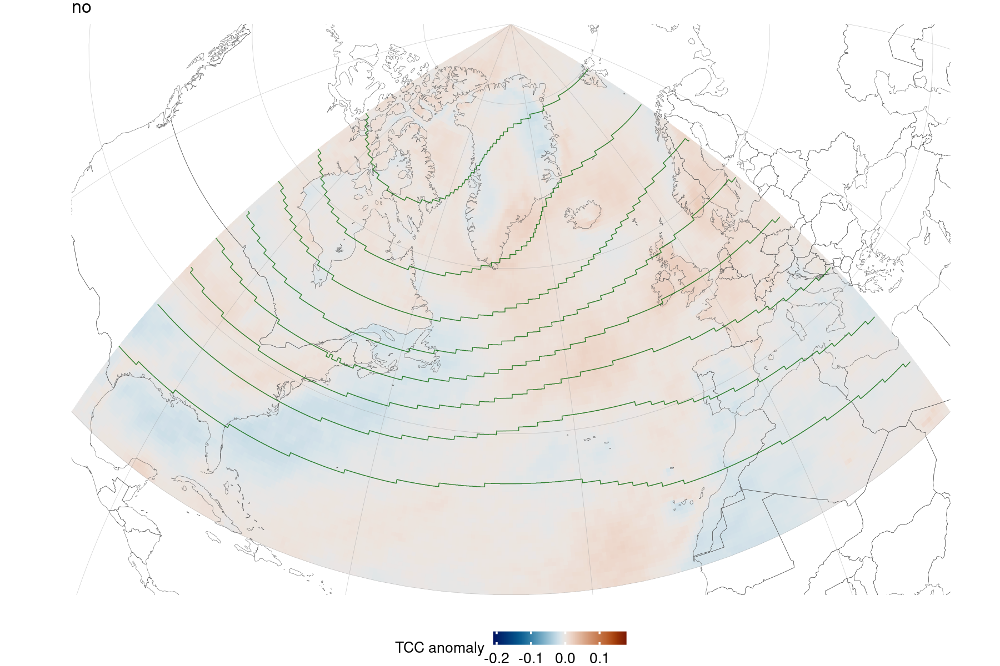

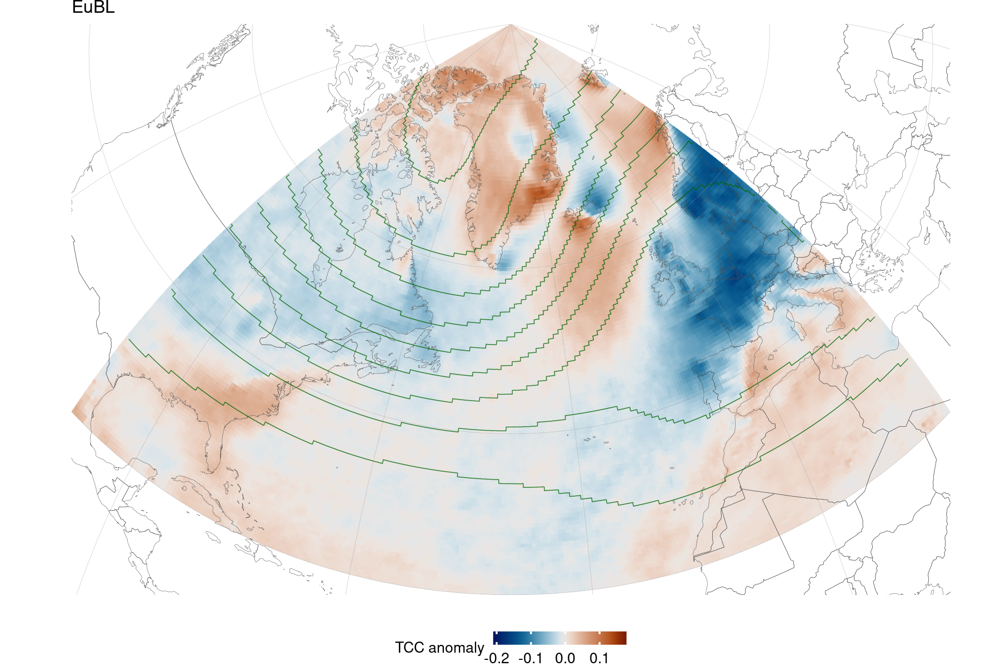

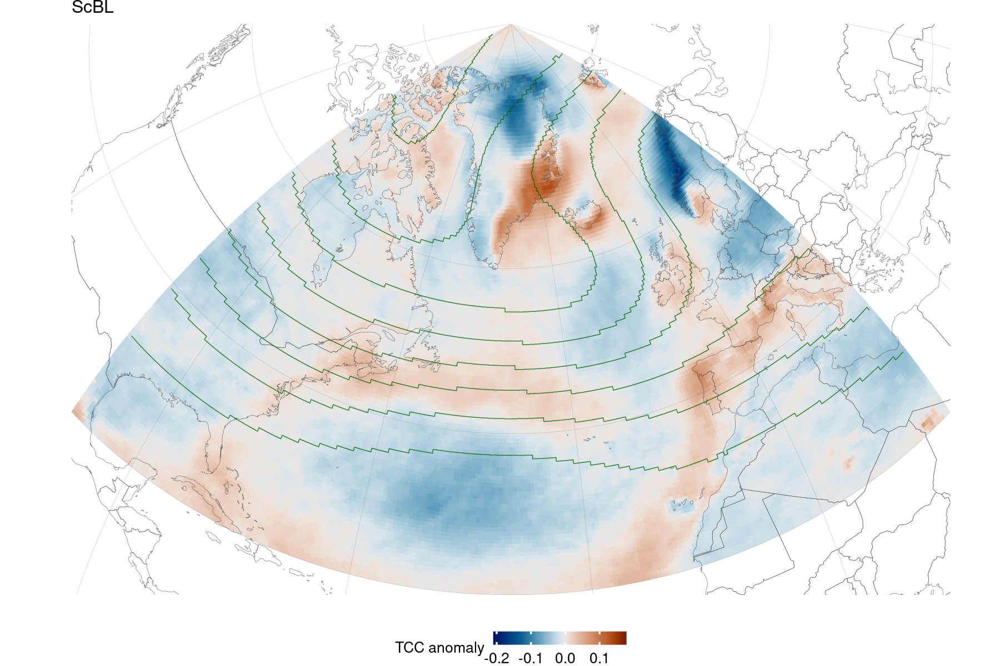

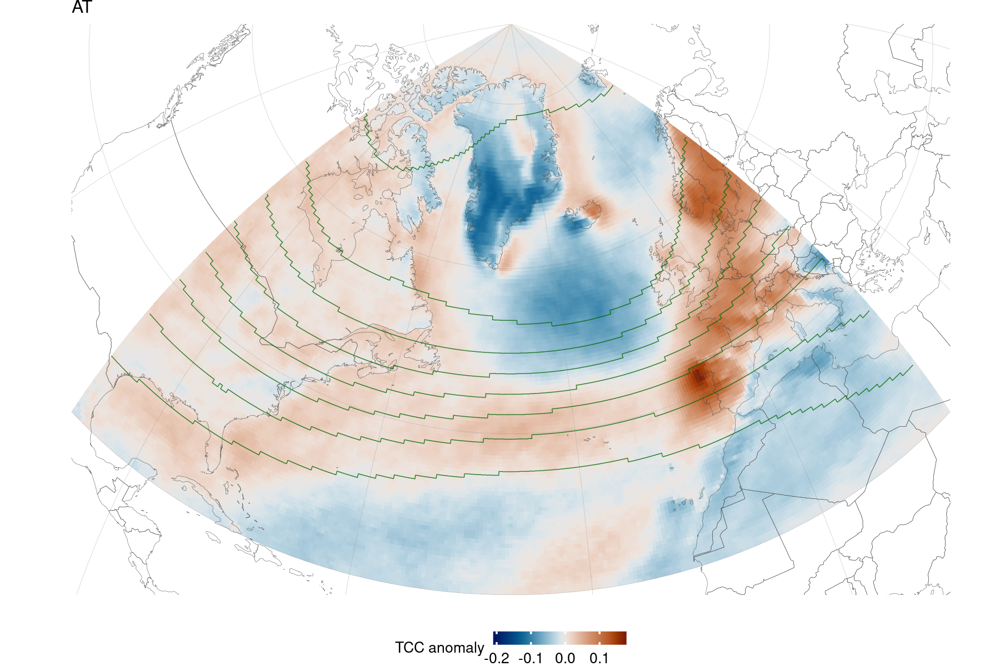

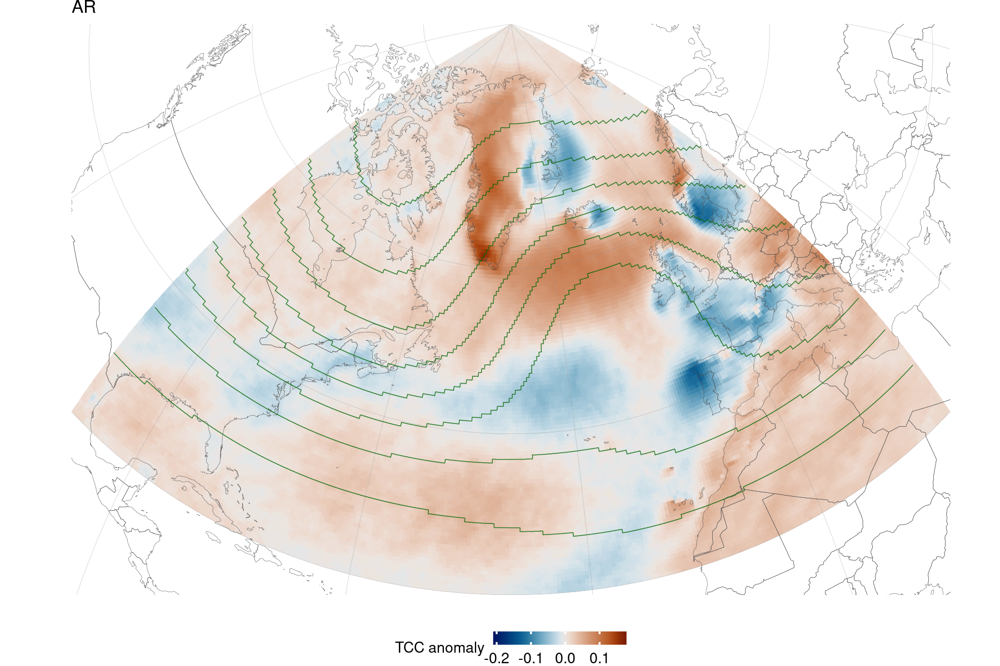

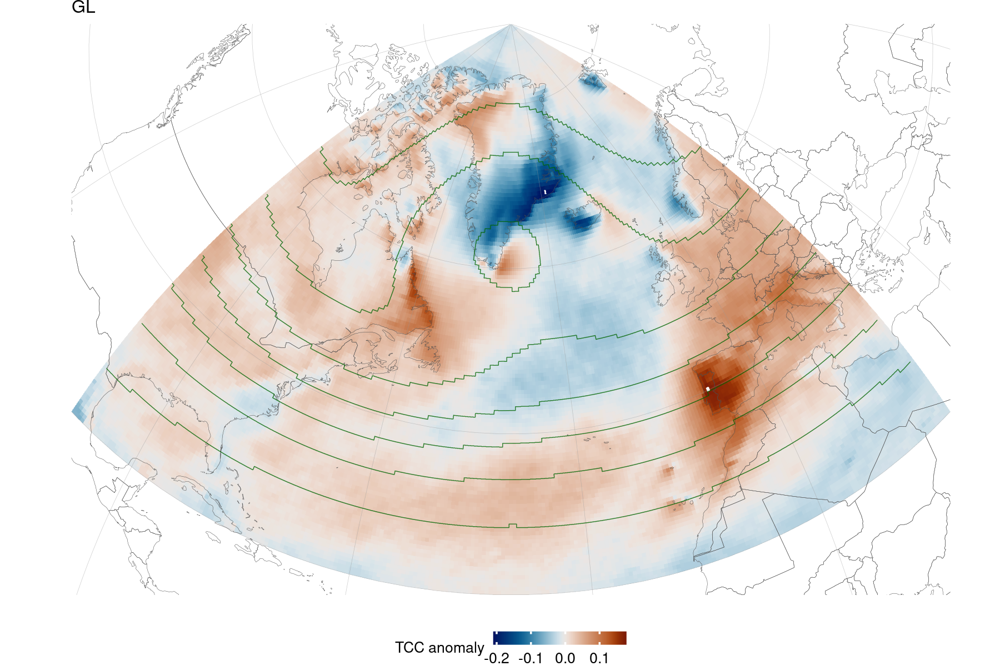

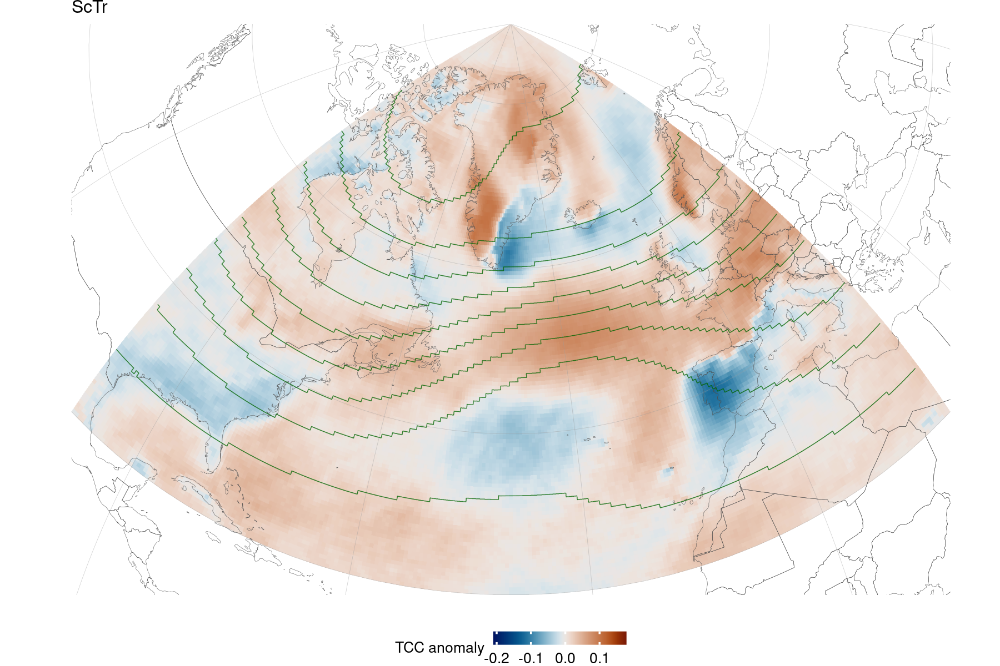

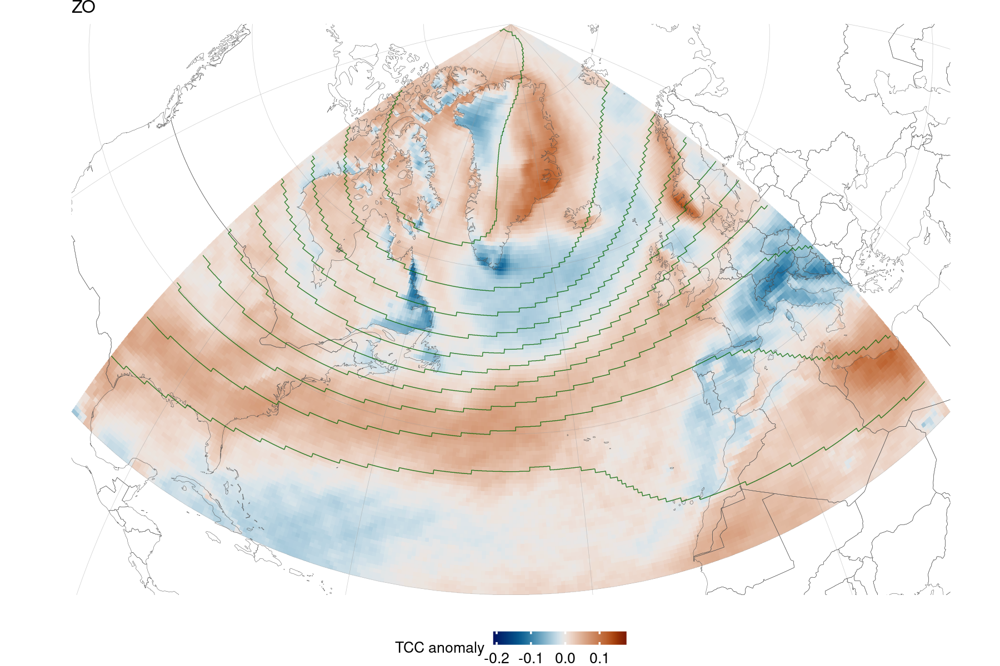

In [13]:
clims <- range(comp_df$tcc)
for (wrn in unique(comp_df$wrname)) {
    wr_df_i <- comp_df %>%
        filter(wrname == wrn)
    # Plotting the mean
    p <- plot_spatial(wr_df_i, "tcc_anom",
        legend_name = "TCC anomaly",
        clims = clims,
        use_diverging = TRUE,
    ) + THEME_PUB_LARGE +
        theme(
            axis.text.x = element_blank(),
            axis.text.y = element_blank(),
            axis.ticks = element_blank(),
            legend.position = "bottom",
            plot.margin = margin(0, 0, 0, 0),
            panel.spacing = unit(0, "lines")
        ) + labs(title = wrn)
    p <- add_contour(
        p, wr_df_i,
        contour_var = "z",
        contour_color = "darkgreen",
        contour_linewidth = 0.4,
        CRS = CRS,
        contour_linetype = "solid",
        resolution_factor = 16,
        contour_binwidth = 9807 # every 100 gpdm
    )
    print(p)
}


# Now with p-values

In [6]:
str(z_comp)


Classes ‘data.table’ and 'data.frame':	271848 obs. of  5 variables:
 $ z      : num  51293 51288 51285 51280 51276 ...
 $ lon    : num  -100 -100 -100 -100 -100 -100 -100 -100 -100 -100 ...
 $ lat    : num  90 89.5 89 88.5 88 87.5 87 86.5 86 85.5 ...
 $ wrindex: Factor w/ 8 levels "1","6","7","2",..: 8 8 8 8 8 8 8 8 8 8 ...
 $ wrname : Factor w/ 8 levels "AT","ZO","ScTr",..: 8 8 8 8 8 8 8 8 8 8 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [5]:
tcc_df <- readRDS("../data/tcc_WR_Comp.RDS")
tcc_df <- tcc_df %>%
    left_join(
        tcc_df %>%
            filter(wrindex == -999) %>%
            select(-c(wrindex, p_val)) %>% # remove category column for join
            rename(baseline_mean = mean), # rename to avoid conflicts
        by = c("lon", "lat")
    ) %>%
    # Calculate anomaly
    mutate(anomaly = mean - baseline_mean)
str(tcc_df)


'data.frame':	262449 obs. of  7 variables:
 $ wrindex      : Factor w/ 9 levels "-999","0","1",..: 1 2 6 7 3 4 5 9 8 1 ...
 $ mean         : num  0.906 0.908 0.92 0.908 0.898 ...
 $ p_val        : num  NA 0.5234 0.0207 0.7677 0.2105 ...
 $ lat          : num  90 90 90 90 90 90 90 90 90 90 ...
 $ lon          : num  -80 -80 -80 -80 -80 -80 -80 -80 -80 -79.5 ...
 $ baseline_mean: num  0.906 0.906 0.906 0.906 0.906 ...
 $ anomaly      : num  0 0.0018 0.01369 0.00177 -0.00768 ...


In [6]:
tcc_df <- left_join(tcc_df, z_comp %>% select(lon, lat, wrindex, wrname, z),
    by = c("lon" = "lon", "lat" = "lat", "wrindex" = "wrindex")
) %>% mutate(wr = wrindex)
str(tcc_df)


'data.frame':	262449 obs. of  10 variables:
 $ wrindex      : Factor w/ 9 levels "-999","0","1",..: 1 2 6 7 3 4 5 9 8 1 ...
 $ mean         : num  0.906 0.908 0.92 0.908 0.898 ...
 $ p_val        : num  NA 0.5234 0.0207 0.7677 0.2105 ...
 $ lat          : num  90 90 90 90 90 90 90 90 90 90 ...
 $ lon          : num  -80 -80 -80 -80 -80 -80 -80 -80 -80 -79.5 ...
 $ baseline_mean: num  0.906 0.906 0.906 0.906 0.906 ...
 $ anomaly      : num  0 0.0018 0.01369 0.00177 -0.00768 ...
 $ wrname       : Factor w/ 8 levels "AT","ZO","ScTr",..: NA 8 5 6 1 4 7 3 2 NA ...
 $ z            : num  NA 51285 50926 51796 51282 ...
 $ wr           : Factor w/ 9 levels "-999","0","1",..: 1 2 6 7 3 4 5 9 8 1 ...


Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven horizontal intervals and will be shifted
ℹ Consider using `geom_tile()` instead.”
Warning message:
“Raster pixels are placed at uneven ho

pdf 
  2

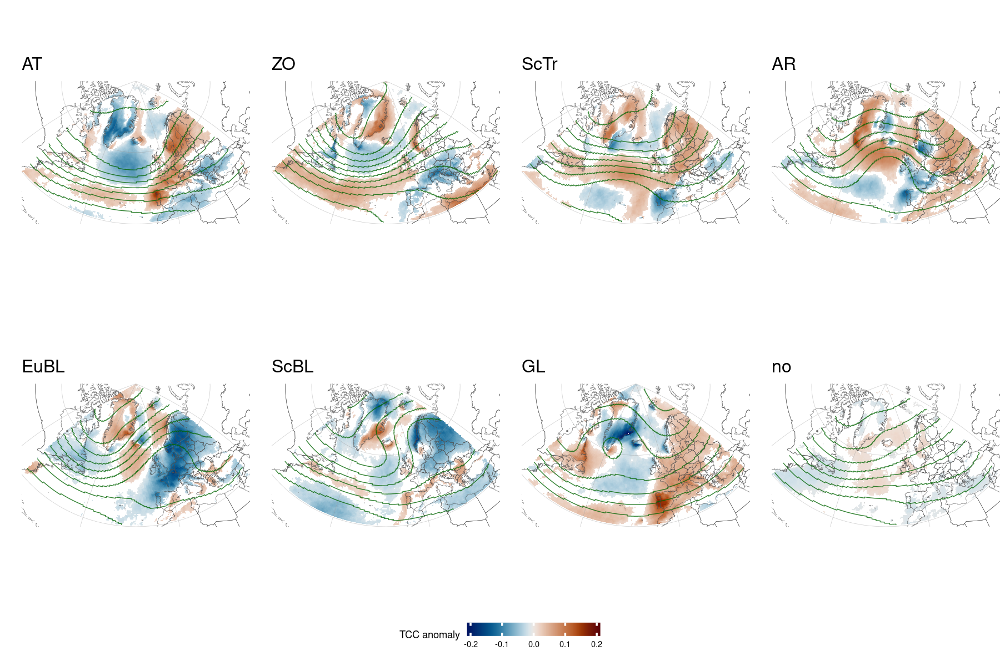

In [10]:
clims <- c(
    -max(abs(min(tcc_df$anomaly)), max(tcc_df$anomaly)),
    max(abs(min(tcc_df$anomaly)), max(tcc_df$anomaly))
)

pps <- grid_and_legend(tcc_df,
    var = "anomaly", sig_name = "p_val",
    alpha = .05, clims = clims, legend_name = "TCC anomaly"
)
p <- combine_plots(pps[[1]], pps[[2]], "horizontal")
print(p)
save_plot(p, "TCCRegimesLargeH.pdf", width = 11.5, height = 5.5)
